In [1]:
from collections import defaultdict

import pandas as pd
import numpy as np
import folium
from folium import plugins
from folium.plugins import HeatMap
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from tqdm.notebook import tqdm
from autowoe import AutoWoE
from sklearn.model_selection import StratifiedKFold

from scipy.stats import rankdata
tqdm.pandas()
import catboost
import shap
shap.initjs()

import matplotlib.pyplot as plt

import typing
import numpy as np
from sklearn.metrics import mean_absolute_percentage_error, r2_score, mean_squared_error, roc_auc_score

THRESHOLD = 0.15
NEGATIVE_WEIGHT = 1.1

def deviation_metric_one_sample(y_true: typing.Union[float, int], y_pred: typing.Union[float, int]) -> float:
    """
    Реализация кастомной метрики для хакатона.

    :param y_true: float, реальная цена
    :param y_pred: float, предсказанная цена
    :return: float, значение метрики
    """
    deviation = (y_pred - y_true) / np.maximum(1e-8, y_true)
    if np.abs(deviation) <= THRESHOLD:
        return 0
    elif deviation <= - 4 * THRESHOLD:
        return 9 * NEGATIVE_WEIGHT
    elif deviation < -THRESHOLD:
        return NEGATIVE_WEIGHT * ((deviation / THRESHOLD) + 1) ** 2
    elif deviation < 4 * THRESHOLD:
        return ((deviation / THRESHOLD) - 1) ** 2
    else:
        return 9


def deviation_metric(y_true: np.array, y_pred: np.array) -> float:
    return np.array([deviation_metric_one_sample(y_true[n], y_pred[n]) for n in range(len(y_true))]).mean()

def median_absolute_percentage_error(y_true: np.array, y_pred: np.array) -> float:
    return np.median(np.abs(y_pred-y_true)/y_true)

def smape(A, F):
    return np.mean(2 * np.abs(F - A) / (np.abs(A) + np.abs(F)))


def metrics_stat(y_true: np.array, y_pred: np.array, price_type=None) -> typing.Dict[str,float]:
    if price_type is not None:
        idx = price_type == 1
        y_true = np.array(y_true[idx])
        y_pred = np.array(y_pred[idx])
    mape = mean_absolute_percentage_error(y_true, y_pred)
    mdape = median_absolute_percentage_error(y_true, y_pred)
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    r2 = r2_score(y_true, y_pred)
    raif_metric = deviation_metric(y_true, y_pred)
    return {'mape':mape, 'mdape':mdape, 'rmse': rmse, 'r2': r2, 'raif_metric':raif_metric}

def deviation_metric_vec(y_true: np.array, y_pred: np.array) -> float:
    deviation = (y_pred - y_true) / np.maximum(1e-8, y_true)
    
    metr = deviation * 0.0 + 9
    
    metr[np.abs(deviation) <= THRESHOLD] = 0
    
    metr[deviation <= - 4 * THRESHOLD] = 9 * NEGATIVE_WEIGHT
    
    mask = (-4 * THRESHOLD < deviation) & (deviation < -THRESHOLD)
    metr[mask] = NEGATIVE_WEIGHT * ((deviation[mask] / THRESHOLD) + 1) ** 2
    
    mask = (deviation < 4 * THRESHOLD) & (deviation > THRESHOLD)
    metr[mask] = ((deviation[mask] / THRESHOLD) - 1) ** 2
    
    return metr.mean()

In [2]:
TARGET = 'per_square_meter_price'
cat_features = ['region', 'street', 'city', 'realty_type',]
features = cat_features + ['floor', 'osm_amenity_points_in_0.001',
       'osm_amenity_points_in_0.005', 'osm_amenity_points_in_0.0075',
       'osm_amenity_points_in_0.01', 'osm_building_points_in_0.001',
       'osm_building_points_in_0.005', 'osm_building_points_in_0.0075',
       'osm_building_points_in_0.01', 'osm_catering_points_in_0.001',
       'osm_catering_points_in_0.005', 'osm_catering_points_in_0.0075',
       'osm_catering_points_in_0.01', 'osm_city_closest_dist',
      'osm_city_nearest_population',
       'osm_crossing_closest_dist', 'osm_crossing_points_in_0.001',
       'osm_crossing_points_in_0.005', 'osm_crossing_points_in_0.0075',
       'osm_crossing_points_in_0.01', 'osm_culture_points_in_0.001',
       'osm_culture_points_in_0.005', 'osm_culture_points_in_0.0075',
       'osm_culture_points_in_0.01', 'osm_finance_points_in_0.001',
       'osm_finance_points_in_0.005', 'osm_finance_points_in_0.0075',
       'osm_finance_points_in_0.01', 'osm_healthcare_points_in_0.005',
       'osm_healthcare_points_in_0.0075', 'osm_healthcare_points_in_0.01',
       'osm_historic_points_in_0.005', 'osm_historic_points_in_0.0075',
       'osm_historic_points_in_0.01', 'osm_hotels_points_in_0.005',
       'osm_hotels_points_in_0.0075', 'osm_hotels_points_in_0.01',
       'osm_leisure_points_in_0.005', 'osm_leisure_points_in_0.0075',
       'osm_leisure_points_in_0.01', 'osm_offices_points_in_0.001',
       'osm_offices_points_in_0.005', 'osm_offices_points_in_0.0075',
       'osm_offices_points_in_0.01', 'osm_shops_points_in_0.001',
       'osm_shops_points_in_0.005', 'osm_shops_points_in_0.0075',
       'osm_shops_points_in_0.01', 'osm_subway_closest_dist',
       'osm_train_stop_closest_dist', 'osm_train_stop_points_in_0.005',
       'osm_train_stop_points_in_0.0075', 'osm_train_stop_points_in_0.01',
       'osm_transport_stop_closest_dist', 'osm_transport_stop_points_in_0.005',
       'osm_transport_stop_points_in_0.0075',
       'osm_transport_stop_points_in_0.01',
       'reform_count_of_houses_1000', 'reform_count_of_houses_500',
       'reform_house_population_1000', 'reform_house_population_500',
       'reform_mean_floor_count_1000', 'reform_mean_floor_count_500',
       'reform_mean_year_building_1000', 'reform_mean_year_building_500','total_square']

In [4]:
train = pd.read_csv('./data/train.csv', dtype={'floor':str})
test = pd.read_csv('./data/test.csv', dtype={'floor':str})

*Визуализация расположения объектов на карте*

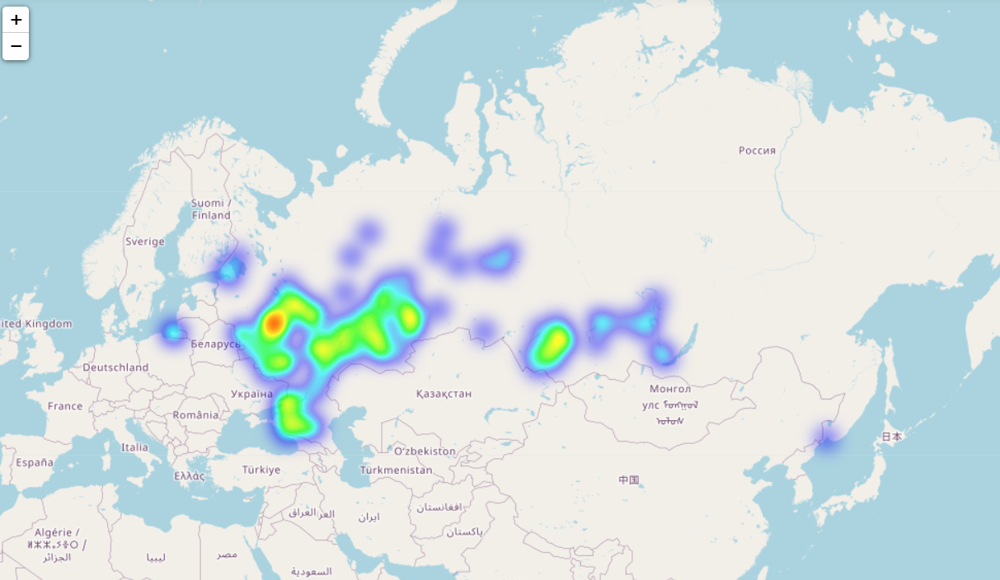

In [5]:
m = folium.Map([58, 76], zoom_start=3)
hm = plugins.HeatMap(train[['lat', 'lng']].values, radius=12)
hm.add_to(m)
m

#### Генерируем гео-факторы

In [6]:
train['lat_r'] = np.radians(train['lat'])
train['lon_r'] = np.radians(train['lng'])

test['lat_r'] = np.radians(test['lat'])
test['lon_r'] = np.radians(test['lng'])

In [7]:
idx1 = train['lat_r'].values
idx2 = train['lon_r'].values

In [8]:
def dist(lat1, lon1, lat2, lon2):
    R = 6373.0
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat / 2.0)**2.0 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2.0
    c = 2.0 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    return R * c

In [9]:
train['lat_lon_r'] = [(a,b) for a, b in zip(train['lat_r'], train['lon_r'])]
test['lat_lon_r'] = [(a,b) for a, b in zip(test['lat_r'], test['lon_r'])]

In [10]:
idx_manual = (train['price_type'] == 1).values
col_price = train[TARGET].values

def dist_features(x):
    d = dist(idx1, idx2, *x)
    idx = (d > 0.0) & (d < 3.0)
    v_s1 = col_price[idx & idx_manual]
    v_s2 = col_price[idx & ~idx_manual]
    r = [np.nan] * 10
    if len(v_s1):
        r[0] = v_s1.min()
        r[1] = v_s1.mean()
        r[2] = v_s1.max()
        r[3] = v_s1.std()
    r[4] = len(v_s1)
    if len(v_s2):
        r[5] = v_s2.min()
        r[6] = v_s2.mean()
        r[7] = v_s2.max()
        r[8] = v_s2.std()
    r[9] = len(v_s2)
    return np.array(r)

In [11]:
agg_features = ['man_min', 'man_mean', 'man_max', 'man_std', 'man_len', 'nman_min', 'nman_mean', 'nman_max', 'nman_std', 'nman_len']

In [12]:
train.loc[train['price_type'] == 1, agg_features] = np.stack(train[train['price_type'] == 1]['lat_lon_r'].progress_map(dist_features))
test.loc[test['price_type'] == 1, agg_features] = np.stack(test[test['price_type'] == 1]['lat_lon_r'].progress_map(dist_features))

  0%|          | 0/4493 [00:00<?, ?it/s]

  0%|          | 0/2974 [00:00<?, ?it/s]

In [13]:
features.extend(agg_features)

#### Предобработка факторов этаж и улица

In [14]:
def parse_floor(x):
    if not isinstance(x, str) and np.isnan(x):
        return -10
    x = str(x).strip().replace('этаж', '').replace('-й', '').replace('цоколь', '-1').replace('подвал', '-1')
    if x.count(',') > 0 or x.count('+') > 0:
        return 100 + x.count(',') +  x.count('+')
    try:
        return int(float(x))
    except ValueError:
        return -11

In [15]:
train['floor'] = train['floor'].map(parse_floor) 
test['floor'] = test['floor'].map(parse_floor) 

In [16]:
street_mapper = train['street'].value_counts().to_dict()
street_mapper = {k: i for i, (k, v) in enumerate(street_mapper.items(), start=1) if v > 10}
street_mapper = defaultdict(lambda: 0, street_mapper)
train['street'] = train['street'].map(street_mapper)
test['street'] = test['street'].map(street_mapper)

In [17]:
train[cat_features] = train[cat_features].astype(str).fillna('__NAN__')
test[cat_features] = test[cat_features].astype(str).fillna('__NAN__')

#### Обучение модели только на размеченных в ручную объектах

In [18]:
train2 = train[train['price_type'] == 1].reset_index(drop=True).copy()

In [19]:
oof_pred = np.zeros_like(train2[TARGET], dtype=np.float64) * np.nan
kfold = StratifiedKFold(n_splits=5 , shuffle=True, random_state=42)
clfs = []
test['pred'] = 0
for train_idx, valid_idx in tqdm(kfold.split(train2[TARGET], train2['city']), total=kfold.n_splits):
    train_pool = catboost.Pool(train2.loc[train_idx, features], train2.loc[train_idx, TARGET],
                               weight=train2.loc[train_idx, 'price_type'].map({1: 1, 0: 0.1}),
                               cat_features=cat_features)
    valid_pool = catboost.Pool(train2.loc[valid_idx, features], train2.loc[valid_idx, TARGET], 
                               weight=train2.loc[valid_idx, 'price_type'].map({1: 1, 0: 0.1}),
                               cat_features=cat_features)
    clf = catboost.CatBoostRegressor(iterations=1000, learning_rate=0.05, eval_metric='SMAPE', loss_function='RMSE')
    clf.fit(train_pool, eval_set=valid_pool, verbose=0)
    oof_pred[valid_idx] = clf.predict(valid_pool)
    
    test['pred'] += clf.predict(test[features]) / kfold.n_splits
    clfs.append(clf)

  0%|          | 0/5 [00:00<?, ?it/s]

*Как видно из представленной shap-важности ниже, сгенерированные нами гео-факторы и предобработанные факторы имеют высокое значение для модели.*

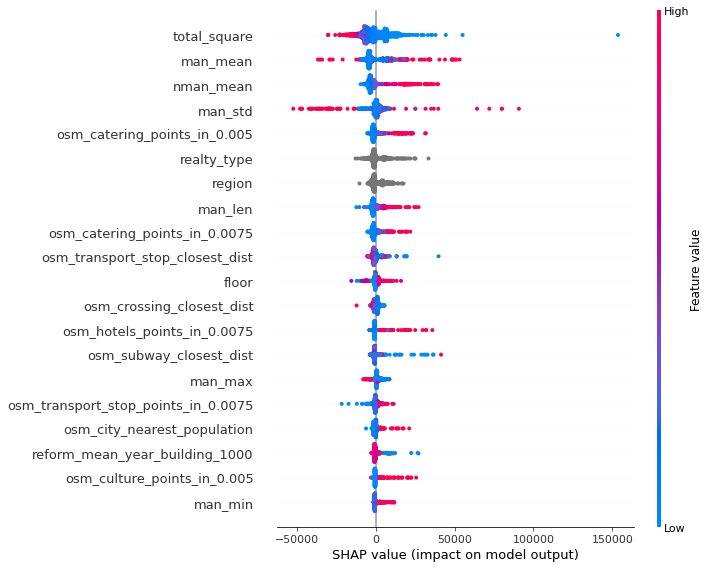

In [20]:
explainer = shap.TreeExplainer(clf)
shap_values = explainer.shap_values(valid_pool)
shap.summary_plot(shap_values, train2.loc[valid_idx, features])

In [21]:
metrics_stat(train2[TARGET], oof_pred, train2['price_type'].values)

{'mape': 0.292921559766167,
 'mdape': 0.1861346454620617,
 'rmse': 62262.75220721472,
 'r2': 0.5150374401044222,
 'raif_metric': 1.5484996986386217}

In [22]:
# калиброка модели не требуется
train2[TARGET].mean(), (oof_pred).mean() 

(69158.61150700836, 68563.03610270277)

*Разброс истинных и предсказанных значений*

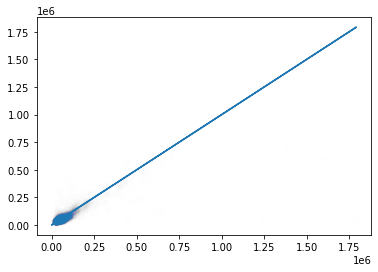

In [23]:
plt.plot(train2[TARGET], train2[TARGET])
plt.scatter(train2[TARGET], oof_pred, alpha=0.002)

In [24]:
submit = test[['id', 'pred']].copy()
submit.rename({'pred': 'per_square_meter_price'}, axis=1, inplace=True)
submit.to_csv('submit/public_submision.csv', index=False)